# Topic Modeling for Patent data

- For keyword dataset

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
from IPython.core.display import HTML
css = open('style-table.css').read() + open('style-notebook.css').read()
HTML('<style>{}</style>'.format(css))

In [3]:
import nltk
import sys
import re, numpy as np, pandas as pd

In [4]:
# Visualization 
import matplotlib.pyplot as plt
import seaborn as sns
from pprint import pprint
%matplotlib inline
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [5]:
# Bokeh
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, CustomJS, ColumnDataSource, Slider
from bokeh.layouts import column
from bokeh.palettes import all_palettes
output_notebook()

Loading BokehJS ...

In [6]:
# plotly
import plotly.graph_objs as go
import plotly.offline as py
from plotly.graph_objs import *
import plotly.figure_factory as ff

py.init_notebook_mode()

In [7]:
# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.utils import lemmatize, simple_preprocess
from gensim.models import CoherenceModel

In [8]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use', 'not', 'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

In [9]:
# for clustering and networking
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon
import networkx as nx
import itertools as itt

In [10]:
import pickle
#Loading from firm cleaned file
patent_firm = pd.read_pickle('patent_firm_full_clean.pkl')
patent_firm.shape

(68764, 35)

In [11]:
patent_csv=pd.read_csv('patent_all_en_new.csv')
patent_csv.shape

(68764, 34)

In [12]:
patent = pd.read_pickle('eda.pkl')
patent.shape

(68762, 38)

In [13]:
patent=pd.read_csv('eda.csv')
patent.shape

(68762, 39)

In [14]:
patent.head()

,Unnamed: 0,Unnamed: 0.1,appln,appln_id,family_id,sets,direct,granted,earliest_appln,earliest_filing_date,...,citing_appln_id,citing_family_id,num_citing_family,earliest_applt,current_applt,appln_title,appln_abstr,assignee,application_date,year
0,0,0,WO9105114W,47158713,1239277,2,1,1,US55592190A,1990-07-19,...,45621927,24395918,30,LUZ ELECTRIC FUEL ISRAEL LTD.,LUZ ELECTRIC FUEL ISRAEL LTD.,ELECTRICAL ENERGY SYSTEM,An electrical energy system including an elect...,luz electric fuel israel ltd,1990-07-19,1990
1,1,1,US55592190A,51797454,1239277,2,1,1,US55592190A,1990-07-19,...,52393850\r\r\n16916549\r\r\n54353461\r\r\n4821...,27071024\r\r\n1239277\r\r\n25508001\r\r\n22545...,30,"Luz Electric Fuel Israel, Ltd.","Luz Electric Fuel Israel, Ltd.",Electrical energy system,An electrical energy system including an elect...,luz electric fuel israel ltd,1990-07-19,1990
2,2,2,EP96927918A,17205496,1341188,4,0,0,JP4059995A,1995-02-28,...,15814252\r\r\n12936842\r\r\n12970055\r\r\n5717...,7646156\r\r\n7646156\r\r\n7672964\r\r\n40580359,31,"SUMITOMO ELECTRIC INDUSTRIES, LTD.","SUMITOMO ELECTRIC INDUSTRIES, LTD.",PARTICULATE TRAP FOR A DIESEL ENGINE,An object is to provide a particulate trap for...,sumitomo electric industries ltd,1995-02-28,1995
3,3,3,JP4059995A,27121457,1341188,4,1,0,JP4059995A,1995-02-28,...,328440678\r\r\n332201837\r\r\n406999716\r\r\n3...,40580359\r\r\n40580359\r\r\n40580359\r\r\n4058...,31,SUMITOMO ELECTRIC IND LTD,SUMITOMO ELECTRIC IND LTD,PARTICULATE TRAP FOR DIESEL ENGINE,PURPOSE: To obtain a trap by which the leakage...,sumitomo electric ind ltd,1995-02-28,1995
4,4,4,WO9602405W,30070806,1341188,4,0,0,JP4059995A,1995-02-28,...,NaN,NaN,31,"Sumitomo Electric Industries, Ltd.","Sumitomo Electric Industries, Ltd.",PARTICULATE TRAP FOR A DIESEL ENGINE,A particulate trap for a diesel engine designe...,sumitomo electric industries ltd,1995-02-28,1995


- appln                     The identifier of the application (with letter at the end, seems Google omits that)
- appln_id                  The (internal) patstat identifier of the application
- family_id                 The (internal) patstat identifier of the family that the application is a member of sets  - sets                      Indicate which sets (fuel-cell = 1, electric  vehicle = 2, both = 3) was matched
- direct                    Indicate whether this application was found directly (title/abstract/cpc/ipc) or      indirectly (family association)
- granted                   Whether or not the application was granted
- earliest_appln            Per family, the earliest application
- earliest_filing_date      The date of the family's earliest application
- publn                     Identifiers of publications associated with this application (*)
- publn_date                The dates of associated publications (*)
- publn_first_grant         Indicates for each publication if its the first one with granted status
- num_cpc_class             The number of CPC classes for this application
- cpc_class                 The CPC class symbols for this application
- num_ipc_class             The number of IPC classes for this application
- ipc_class                 The IPC class symbols for this application
- num_cited_publn           The number of forward citations (this applications refers to other publications)
- cited_publn_date          The dates of cited publications (**)
- cited_publn               The identifiers of cited publications (**)
- cited_appln               The identifiers of the applications  associated with cited publications (**)
- cited_appln_id            The (internal) patstat identifiers of the  applications associated with cited publications (**)
- cited_family_id           The (internal) patstat identifiers of the  family associated with cited publications (**)
- num_cited_family          The total number of distinct families  associated with cited publications (***)
- num_citing_publn          The number of backward citations (other  publications refer to this application)
- citing_publn_date         The dates of citing publications (**)
- citing_publn              The identifiers of citing publications (**)
- citing_appln              The identifiers of the applications  associated with citing publications (**)
- citing_appln_id           The (internal) patstat identifiers of the  applications associated with citing publications (**)
- citing_family_id          The (internal) patstat identifiers of the  family associated with citing publications (**)
- num_citing_family         The total number of distinct families  associated with citing publications (***)
- earliest_applt            The name of the (first) applicant of the  earliest publication of this application 
- current_applt             The name of the (first) applicant of the most recent publication of this application
- appln_title               The title of this application
- assignee                  Cleaning and preprocessed firm titles (^)
- applicate_date            Earliest filing date in date-time format
- year                      Earliest filling date in year.....excluding day and month

>>
>> (*/**) These are one per line, in consistent order


>> (***) These seem to be the numbers that google uses to count citations. You can get this from the export if you aggregate all applications within a family and discard duplicates.

>> (^) This column is taken from previous file i.e File1-Firm_Preprocessing





>> **We have added two new columns i.e application_date and year**

In [15]:
patent.head(2)

,Unnamed: 0,Unnamed: 0.1,appln,appln_id,family_id,sets,direct,granted,earliest_appln,earliest_filing_date,...,citing_appln_id,citing_family_id,num_citing_family,earliest_applt,current_applt,appln_title,appln_abstr,assignee,application_date,year
0,0,0,WO9105114W,47158713,1239277,2,1,1,US55592190A,1990-07-19,...,45621927,24395918,30,LUZ ELECTRIC FUEL ISRAEL LTD.,LUZ ELECTRIC FUEL ISRAEL LTD.,ELECTRICAL ENERGY SYSTEM,An electrical energy system including an elect...,luz electric fuel israel ltd,1990-07-19,1990
1,1,1,US55592190A,51797454,1239277,2,1,1,US55592190A,1990-07-19,...,52393850\r\r\n16916549\r\r\n54353461\r\r\n4821...,27071024\r\r\n1239277\r\r\n25508001\r\r\n22545...,30,"Luz Electric Fuel Israel, Ltd.","Luz Electric Fuel Israel, Ltd.",Electrical energy system,An electrical energy system including an elect...,luz electric fuel israel ltd,1990-07-19,1990


# 1)- Data Preprocessing and cleaning

In [16]:
patent_abst=patent['appln_abstr']
year=patent['year']

In [17]:
chars = list(set(patent_abst)) 
data_size, vocab_size = len(patent_abst), len(chars)
print ("Patent data has chars", data_size)
print ("Patent data has unique chars", vocab_size)

Patent data has chars 68762
Patent data has unique chars 60323


### 1.1)-Tokenize Sentences and Clean

In [18]:
def sent_to_words(sentences):
    for sent in sentences:
        sent = re.sub('\S*@\S*\s?', '', sent)  # remove extra characters
        sent = re.sub('\s+', ' ', sent)  # remove newline chars
        sent = re.sub("\'", "", sent)  # remove single quotes
        sent = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        yield(sent) 

In [19]:
# Convert to list
data = patent.appln_abstr.values.tolist()
data_words = list(sent_to_words(data))
print(data_words[:1])

[['an', 'electrical', 'energy', 'system', 'including', 'an', 'electric', 'utility', 'having', 'electricity', 'generation', 'apparatus', 'and', 'distribution', 'lines', 'plurality', 'of', 'electric', 'vehicles', 'and', 'electric', 'power', 'storage', 'apparatus', 'receiving', 'electrical', 'power', 'from', 'the', 'electric', 'utility', 'and', 'supplying', 'electrical', 'power', 'to', 'the', 'plurality', 'of', 'electric', 'vehicles', 'and', 'to', 'the', 'electric', 'utility', 'when', 'required', 'discharged', 'slurry', 'is', 'received', 'at', 'discharged', 'slurry', 'storage', 'facility', 'from', 'the', 'electric', 'vehicles', 'and', 'storage', 'battery', 'and', 'supplied', 'to', 'electrolytic', 'cells', 'via', 'suitable', 'pumps', 'the', 'charged', 'slurry', 'is', 'received', 'in', 'facility', 'and', 'then', 'stored', 'in', 'storage', 'battery', 'or', 'supplied', 'to', 'electric', 'vehicles', 'the', 'storage', 'battery', 'provides', 'when', 'necessary', 'or', 'economical', 'electrical',

In [20]:
print(data_words[2])

['an', 'object', 'is', 'to', 'provide', 'particulate', 'trap', 'for', 'diesel', 'engine', 'which', 'can', 'efficiently', 'burn', 'particulates', 'trapped', 'by', 'filter', 'while', 'supplying', 'oxygen', 'by', 'natural', 'convection', 'so', 'that', 'the', 'filter', 'can', 'be', 'regenerated', 'in', 'short', 'time', 'while', 'minimizing', 'the', 'power', 'consumed', 'by', 'the', 'heater', 'to', 'accomplish', 'this', 'purpose', 'end', 'plates', 'and', 'brackets', 'may', 'be', 'welded', 'to', 'compressed', 'portions', 'of', 'an', 'inner', 'cylinder', 'and', 'an', 'outer', 'cylinder', 'heater', 'supporting', 'ceramic', 'insulators', 'are', 'mounted', 'spaced', 'from', 'each', 'other', 'on', 'heater', 'and', 'or', 'an', 'ambient', 'air', 'introducing', 'passage', 'is', 'provided', 'to', 'extend', 'from', 'outside', 'the', 'case', 'into', 'multiple', 'cylinder', 'filter', 'provided', 'in', 'the', 'case', 'image']


### 1.2)-Build the Bigram, Trigram Models,Postag and Lemmatize
postage : NOUN', 'ADJ', 'VERB', 'ADV

In [21]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [22]:
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

data_ready = process_words(data_words)  # processed Text Data!

In [23]:
df_data_ready = pd.DataFrame(data_ready)

In [24]:
df_data_ready.head()

,0,1,2,3,4,5,6,7,8,9,...,802,803,804,805,806,807,808,809,810,811
0,electrical,energy,system,include,electric,utility,electricity,generation,apparatus,distribution,...,None,None,None,None,None,None,None,None,None,None
1,electrical,energy,system,include,electric,utility,electricity,generate,apparatus,distribution,...,None,None,None,None,None,None,None,None,None,None
2,object,provide,particulate,trap,diesel,engine,efficiently,burn,particulate,trap,...,None,None,None,None,None,None,None,None,None,None
3,purpose,obtain,trap,leakage,exhaust,gas,portion,filter,part,surely,...,None,None,None,None,None,None,None,None,None,None
4,particulate,trap,diesel,engine,design,efficiently,burn,particulate,collect,filter,...,None,None,None,None,None,None,None,None,None,None


In [25]:
df_data_ready.shape

(68762, 812)

In [26]:
import pickle

In [27]:
df_data_ready.to_pickle('data_ready.pkl')

# 2)-Build the Topic Model

### 2.1)- Create Dictionary

In [28]:
#bag of words
id2word = corpora.Dictionary(data_ready)

In [29]:
print(len(id2word))

25260


In [30]:
count = 0
for k, v in id2word.iteritems():
    print(k, v, id2word.dfs[k])
    count += 1
    if count > 10:
        break

0 activity 195
1 apparatus 5573
2 battery 13782
3 cell 6581
4 charge 11880
5 combination 816
6 conversion 1219
7 demand 1697
8 discharge 4847
9 disparate 1
10 distribution 1510


Filter out tokens that appear in
- less than 15 documents (absolute number) or
- more than 0.5 documents (fraction of total corpus size, not absolute number).
- after the above two steps, keep only the first 4000 most frequent tokens.

In [31]:
id2word.filter_extremes(no_below=15, no_above=0.5, keep_n=4000)

In [32]:
print(len(id2word))

4000


In [33]:
print (id2word[3])

cell


id2word is a dictionary that contains words. All of our data word.

### 2.2)-Create Corpus: Term Document Frequency

In [34]:
corpus = [id2word.doc2bow(text) for text in data_ready]
corpus[500]

[(19, 1),
 (20, 1),
 (22, 1),
 (39, 2),
 (41, 1),
 (128, 1),
 (145, 1),
 (177, 1),
 (193, 1),
 (251, 1),
 (271, 1),
 (277, 1),
 (286, 1),
 (296, 1),
 (311, 1),
 (351, 1),
 (353, 1),
 (360, 1),
 (370, 2),
 (372, 1),
 (374, 2),
 (376, 1),
 (379, 2),
 (382, 1),
 (392, 1),
 (393, 1),
 (402, 7),
 (403, 1),
 (404, 3),
 (409, 1),
 (429, 1),
 (443, 1),
 (465, 1),
 (482, 2),
 (498, 1),
 (513, 1),
 (521, 1),
 (542, 1),
 (550, 1),
 (615, 1),
 (629, 1),
 (648, 1),
 (650, 1),
 (688, 1),
 (716, 1),
 (718, 1),
 (750, 1),
 (867, 1),
 (1023, 1),
 (1046, 1),
 (1121, 1),
 (1123, 1),
 (1132, 1),
 (1201, 1),
 (1211, 1),
 (1212, 1),
 (2122, 1),
 (2274, 3),
 (2325, 1),
 (2326, 1)]

In [35]:
print(len(corpus))

68762


In [36]:
bow_doc_500 = corpus[500]

for i in range(len(bow_doc_500)):
    print("Word {} (\"{}\") appears {} time.".format(bow_doc_500[i][0], 
                                                     id2word[bow_doc_500[i][0]], 
                                                     bow_doc_500[i][1]))

Word 19 ("include") appears 1 time.
Word 20 ("low") appears 1 time.
Word 22 ("operation") appears 1 time.
Word 39 ("system") appears 2 time.
Word 41 ("unit") appears 1 time.
Word 128 ("design") appears 1 time.
Word 145 ("assembly") appears 1 time.
Word 177 ("open") appears 1 time.
Word 193 ("small") appears 1 time.
Word 251 ("component") appears 1 time.
Word 271 ("position") appears 1 time.
Word 277 ("set") appears 1 time.
Word 286 ("connect") appears 1 time.
Word 296 ("attain") appears 1 time.
Word 311 ("arrange") appears 1 time.
Word 351 ("compact") appears 1 time.
Word 353 ("essentially") appears 1 time.
Word 360 ("rotation") appears 1 time.
Word 370 ("oil") appears 2 time.
Word 372 ("relative") appears 1 time.
Word 374 ("seal") appears 2 time.
Word 376 ("work") appears 1 time.
Word 379 ("clutch") appears 2 time.
Word 382 ("drive") appears 1 time.
Word 392 ("shaft") appears 1 time.
Word 393 ("speed") appears 1 time.
Word 402 ("gear") appears 7 time.
Word 403 ("gearbox") appears 1 ti

### Vectorization with TF-IDF

term frequency–inverse document frequency, is a numerical statistic that is intended to reflect how important a word is to a document in a collection or corpus

In [37]:
from gensim import corpora, models

tfidf = models.TfidfModel(corpus)

In [38]:
corpus_tfidf = tfidf[corpus]

In [39]:
from pprint import pprint

for doc in corpus_tfidf:
    pprint(doc)
    break

[(0, 0.12234601256002918),
 (1, 0.10482512094178696),
 (2, 0.10057883254954914),
 (3, 0.048944699460013244),
 (4, 0.03662397371941197),
 (5, 0.09248825621992561),
 (6, 0.084116077396942),
 (7, 0.1544305992058438),
 (8, 0.11064782601565183),
 (9, 0.07965062638033933),
 (10, 0.2428096986749894),
 (11, 0.20977268156767648),
 (12, 0.279676354686831),
 (13, 0.07351907065371859),
 (14, 0.1304851110022101),
 (15, 0.09327333617592355),
 (16, 0.21923068380863),
 (17, 0.06396517830734134),
 (18, 0.038972441551050736),
 (19, 0.02259407221063867),
 (20, 0.08070258029813765),
 (21, 0.08982792695440986),
 (22, 0.036928178957832986),
 (23, 0.11192375339405142),
 (24, 0.11223367257251202),
 (25, 0.15701522858743092),
 (26, 0.09279728280162845),
 (27, 0.03426921818521771),
 (28, 0.058218333781168495),
 (29, 0.1615005153278097),
 (30, 0.06030154276300115),
 (31, 0.11716337874590264),
 (32, 0.4841693125321009),
 (33, 0.13942220866810476),
 (34, 0.36618223240163084),
 (35, 0.058769393783591355),
 (36, 0.0

### 2.3)-Build LDA model


Parameters:	

- corpus ({iterable of list of (int, float), scipy.sparse.csc}, optional) – Stream of document vectors or sparse matrix of shape (num_terms, num_documents). If not given, the model is left untrained (presumably because you want to call update() manually).
- num_topics (int, optional) – The number of requested latent topics to be extracted from the training corpus.
- id2word ({dict of (int, str), gensim.corpora.dictionary.Dictionary}) – Mapping from word IDs to words. It is used to determine the vocabulary size, as well as for debugging and topic printing.
- distributed (bool, optional) – Whether distributed computing should be used to accelerate training.
- chunksize (int, optional) – Number of documents to be used in each training chunk.
- passes (int, optional) – Number of passes through the corpus during training.
- update_every (int, optional) – Number of documents to be iterated through for each update. Set to 0 for batch learning, > 1 for online iterative learning.
- alpha ({numpy.ndarray, str}, optional) –

Can be set to an 1D array of length equal to the number of expected topics that expresses our a-priori belief for the each topics’ probability. Alternatively default prior selecting strategies can be employed by supplying a string:

’asymmetric’: Uses a fixed normalized asymmetric prior of 1.0 / topicno.
’auto’: Learns an asymmetric prior from the corpus (not available if distributed==True).
- eta ({float, np.array, str}, optional) –

A-priori belief on word probability, this can be:

scalar for a symmetric prior over topic/word probability,
vector of length num_words to denote an asymmetric user defined probability for each word,
matrix of shape (num_topics, num_words) to assign a probability for each word-topic combination,
the string ‘auto’ to learn the asymmetric prior from the data.



In [40]:
lda_model = gensim.models.LdaMulticore(corpus=corpus, num_topics=10, id2word=id2word, passes=2, workers=2)

In [41]:
lda_model.save('topic_model_bow')

In [42]:
from gensim.models import LdaModel
lda_model = LdaModel.load('topic_model_bow')

In [43]:
#The trained topics (keywords and weights)
pprint(lda_model.print_topics())

[(0,
  '0.079*"motor" + 0.069*"drive" + 0.035*"torque" + 0.030*"control" + '
  '0.030*"hybrid" + 0.025*"clutch" + 0.024*"electric" + 0.024*"generator" + '
  '0.024*"mode" + 0.021*"transmission"'),
 (1,
  '0.046*"power" + 0.046*"electric" + 0.045*"charge" + 0.045*"battery" + '
  '0.026*"voltage" + 0.022*"control" + 0.022*"system" + 0.016*"module" + '
  '0.015*"current" + 0.015*"device"'),
 (2,
  '0.061*"fuel" + 0.048*"control" + 0.047*"pressure" + 0.028*"valve" + '
  '0.026*"injection" + 0.019*"signal" + 0.018*"pump" + 0.018*"system" + '
  '0.017*"combustion" + 0.015*"internal"'),
 (3,
  '0.049*"first" + 0.048*"gear" + 0.041*"second" + 0.037*"shaft" + '
  '0.027*"connect" + 0.023*"power" + 0.023*"electric" + 0.021*"motor" + '
  '0.020*"drive" + 0.016*"input"'),
 (4,
  '0.034*"value" + 0.031*"temperature" + 0.025*"sensor" + 0.023*"control" + '
  '0.023*"combustion" + 0.019*"determine" + 0.017*"internal" + 0.017*"detect" '
  '+ 0.015*"time" + 0.013*"air"'),
 (5,
  '0.053*"gas" + 0.042*"ex

### Label data
- Topic 0:Plug-in Modules/ automotive connectors
- Topic 1: Automotive Disk Brake
- Topi 2: exhaust gas recirculation (EGR) system
- Topic 3: Battery management system
- Topic 4: electronic security system in vehicles
- Topic 5: Engine Emission Control,
- Topic 6: electric vehicle charging station
- Topic 7:fuel cell technology

### b)- LDA with TF-IDF

In [44]:
lda_model_tfidf = gensim.models.LdaMulticore(corpus=corpus_tfidf, num_topics=10, id2word=id2word, passes=2, workers=2)

"""
lda_model_tfidf = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf,
                                           id2word=id2word,
                                           num_topics=10, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)
                                           
                                    """

"\nlda_model_tfidf = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf,\n                                           id2word=id2word,\n                                           num_topics=10, \n                                           random_state=100,\n                                           update_every=1,\n                                           chunksize=10,\n                                           passes=10,\n                                           alpha='symmetric',\n                                           iterations=100,\n                                           per_word_topics=True)\n                                           \n                                    "

In [45]:
lda_model_tfidf.save('topic_model_tfidf')

In [46]:
from gensim.models import LdaModel
lda_model_tfidf = LdaModel.load('topic_model_tfidf')

In [47]:
#The trained topics (keywords and weights)
pprint(lda_model_tfidf.print_topics())

[(0,
  '0.010*"body" + 0.008*"side" + 0.007*"support" + 0.007*"part" + '
  '0.007*"surface" + 0.007*"portion" + 0.007*"frame" + 0.006*"housing" + '
  '0.006*"end" + 0.006*"plate"'),
 (1,
  '0.033*"wireless" + 0.011*"range_extender" + 0.010*"magnetic" + '
  '0.008*"signal" + 0.008*"current" + 0.007*"coil" + 0.007*"plan" + '
  '0.007*"phase" + 0.006*"pulse" + 0.006*"manager"'),
 (2,
  '0.024*"charge" + 0.021*"battery" + 0.018*"power" + 0.016*"voltage" + '
  '0.015*"electric" + 0.012*"module" + 0.010*"unit" + 0.009*"circuit" + '
  '0.009*"supply" + 0.008*"energy"'),
 (3,
  '0.012*"pressure" + 0.012*"stop" + 0.010*"valve" + 0.009*"control" + '
  '0.008*"throttle" + 0.008*"start" + 0.007*"sensor" + 0.007*"signal" + '
  '0.007*"detect" + 0.006*"fuel"'),
 (4,
  '0.028*"exhaust" + 0.026*"catalyst" + 0.019*"gas" + 0.013*"temperature" + '
  '0.011*"fuel" + 0.011*"combustion" + 0.010*"air" + 0.010*"nox" + '
  '0.009*"ratio" + 0.009*"filter"'),
 (5,
  '0.015*"torque" + 0.011*"mode" + 0.011*"value"

# 3) Evaluating model

### 3.1)- Compute Model Perplexity and Coherence Score
Model perplexity and topic coherence provide a convenient measure to judge how good a given topic model is

In [48]:
# Compute Perplexity:a measure of how good the model is. lower the better.
print('\nPerplexity: ', lda_model.log_perplexity(corpus)) 


Perplexity:  -6.152725701516873


In [49]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.533289224750874


In [50]:
#For TF-IDF
print('\nPerplexity: ', lda_model_tfidf.log_perplexity(corpus_tfidf)) 
coherence_model_lda = CoherenceModel(model=lda_model_tfidf, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -7.8892733261994525

Coherence Score:  0.6115575516422442


### 3.2)- to find the optimal number of topics for LDA

In [51]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [52]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_ready, start=2, limit=40, step=6)

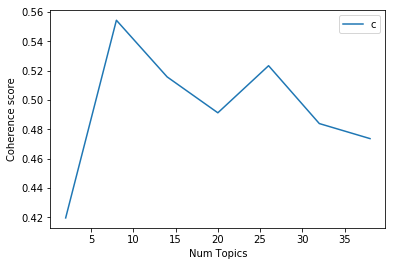

In [53]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [54]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.4195
Num Topics = 8  has Coherence Value of 0.5544
Num Topics = 14  has Coherence Value of 0.5157
Num Topics = 20  has Coherence Value of 0.4912
Num Topics = 26  has Coherence Value of 0.5234
Num Topics = 32  has Coherence Value of 0.4839
Num Topics = 38  has Coherence Value of 0.4736


**As highest value is with topic 8. So , it is best optimal size**

In [55]:
# Select the model and print the topics
optimal_model = model_list[1]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.061*"motor" + 0.051*"drive" + 0.041*"gear" + 0.036*"first" + '
  '0.031*"second" + 0.030*"shaft" + 0.027*"transmission" + 0.025*"clutch" + '
  '0.022*"electric" + 0.022*"hybrid"'),
 (1,
  '0.054*"air" + 0.032*"combustion" + 0.030*"oil" + 0.030*"valve" + '
  '0.021*"internal" + 0.020*"cylinder" + 0.018*"exhaust" + 0.018*"pipe" + '
  '0.017*"intake" + 0.017*"gas"'),
 (2,
  '0.045*"power" + 0.044*"control" + 0.023*"electric" + 0.021*"motor" + '
  '0.021*"battery" + 0.020*"voltage" + 0.020*"mode" + 0.020*"torque" + '
  '0.016*"hybrid" + 0.016*"charge"'),
 (3,
  '0.047*"electric" + 0.044*"charge" + 0.041*"battery" + 0.033*"power" + '
  '0.020*"system" + 0.019*"connect" + 0.019*"module" + 0.016*"unit" + '
  '0.015*"device" + 0.015*"control"'),
 (4,
  '0.022*"side" + 0.019*"part" + 0.019*"body" + 0.017*"end" + 0.014*"portion" '
  '+ 0.014*"support" + 0.013*"surface" + 0.012*"provide" + 0.012*"fix" + '
  '0.012*"plate"'),
 (5,
  '0.045*"control" + 0.026*"combustion" + 0.025*"value" +

# 4)- Repeat same procedure for TF-IDF model as well

In [56]:
# Compute Perplexity:a measure of how good the model is. lower the better.
print('\nPerplexity: ', lda_model_tfidf.log_perplexity(corpus_tfidf)) 


Perplexity:  -7.889133721487892


In [57]:
# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model_tfidf, texts=data_ready, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.6115575516422442


In [58]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus_tfidf, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [59]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus_tfidf, texts=data_ready, start=2, limit=40, step=6)

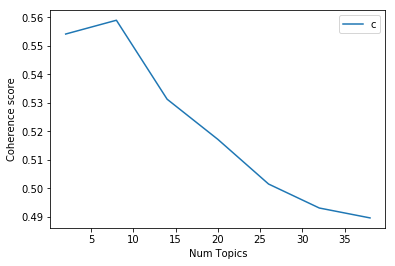

In [60]:
# Show graph
limit=40; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [61]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 2  has Coherence Value of 0.5542
Num Topics = 8  has Coherence Value of 0.559
Num Topics = 14  has Coherence Value of 0.5313
Num Topics = 20  has Coherence Value of 0.5172
Num Topics = 26  has Coherence Value of 0.5016
Num Topics = 32  has Coherence Value of 0.4931
Num Topics = 38  has Coherence Value of 0.4897


In [62]:
# Select the model and print the topics. We choose 8 so, list[1].
optimal_model = model_list[1]
model_topics = optimal_model.show_topics(formatted=False)
pprint(optimal_model.print_topics(num_words=10))

[(0,
  '0.035*"cell" + 0.032*"planetary" + 0.024*"hydrogen" + 0.020*"stack" + '
  '0.018*"fuel" + 0.018*"planet" + 0.012*"grid" + 0.010*"chassis" + '
  '0.008*"charger" + 0.008*"solar"'),
 (1,
  '0.020*"cool" + 0.018*"air" + 0.013*"water" + 0.013*"fuel" + 0.012*"gas" + '
  '0.012*"heat" + 0.011*"oil" + 0.011*"pipe" + 0.010*"exhaust" + 0.010*"tank"'),
 (2,
  '0.026*"charge" + 0.023*"battery" + 0.019*"power" + 0.017*"voltage" + '
  '0.015*"electric" + 0.014*"module" + 0.010*"unit" + 0.009*"energy" + '
  '0.009*"system" + 0.009*"current"'),
 (3,
  '0.016*"torque" + 0.013*"speed" + 0.013*"value" + 0.012*"control" + '
  '0.012*"mode" + 0.009*"travel" + 0.009*"shift" + 0.008*"motor" + '
  '0.008*"start" + 0.008*"hybrid"'),
 (4,
  '0.024*"injection" + 0.021*"fuel" + 0.016*"valve" + 0.016*"cylinder" + '
  '0.015*"pressure" + 0.015*"combustion" + 0.010*"injector" + '
  '0.009*"compression" + 0.009*"internal" + 0.008*"chamber"'),
 (5,
  '0.011*"body" + 0.009*"side" + 0.008*"utility" + 0.008*"end

### 4.1) Label Topic

- Topic 1
- Topic 2
- Topic 3
- Topic 4
- Topic 5
- Topic 6
- Topic 7
- Topic 8

### 4.2)- Save work

In [63]:
optimal_model.save('optimal_topic_model')

In [64]:
from gensim.models import LdaModel
optimal_model  = LdaModel.load('optimal_topic_model')

In [65]:
# use show_topic()
optimal_model.show_topics(num_topics=5)

[(0,
  '0.035*"cell" + 0.032*"planetary" + 0.024*"hydrogen" + 0.020*"stack" + 0.018*"fuel" + 0.018*"planet" + 0.012*"grid" + 0.010*"chassis" + 0.008*"charger" + 0.008*"solar"'),
 (3,
  '0.016*"torque" + 0.013*"speed" + 0.013*"value" + 0.012*"control" + 0.012*"mode" + 0.009*"travel" + 0.009*"shift" + 0.008*"motor" + 0.008*"start" + 0.008*"hybrid"'),
 (7,
  '0.030*"gear" + 0.024*"clutch" + 0.021*"shaft" + 0.020*"transmission" + 0.018*"motor" + 0.016*"drive" + 0.016*"first" + 0.014*"second" + 0.014*"hybrid" + 0.013*"input"'),
 (5,
  '0.011*"body" + 0.009*"side" + 0.008*"utility" + 0.008*"end" + 0.008*"model" + 0.008*"support" + 0.008*"part" + 0.008*"plate" + 0.007*"rear" + 0.007*"front"'),
 (2,
  '0.026*"charge" + 0.023*"battery" + 0.019*"power" + 0.017*"voltage" + 0.015*"electric" + 0.014*"module" + 0.010*"unit" + 0.009*"energy" + 0.009*"system" + 0.009*"current"')]

In [100]:
# for future notebooks

corpus_tfidf.save('corpus_tfidf')
id2word.save('id2word')

# 5)- Analysis of LDA model

The function get_term_topics returns the odds of a particular word belonging to some particular topic

In [66]:
optimal_model.get_term_topics('battery')

[(2, 0.022676447)]

The get_document_topics method returns topic distribution of the document along with topic distribution for each word in that document

In [67]:
print(data_ready[0])

['electrical', 'energy', 'system', 'include', 'electric', 'utility', 'electricity', 'generation', 'apparatus', 'distribution', 'plurality', 'electric', 'vehicle', 'electric', 'power', 'storage', 'apparatus', 'receive', 'electrical', 'power', 'electric', 'utility', 'supply', 'electrical', 'power', 'plurality', 'electric', 'vehicle', 'electric', 'utility', 'require', 'discharge', 'slurry', 'receive', 'discharge', 'slurry', 'storage', 'facility', 'electric', 'vehicle', 'storage', 'battery', 'supply', 'electrolytic', 'cell', 'suitable', 'pump', 'charge', 'slurry', 'receive', 'facility', 'store', 'storage', 'battery', 'supply', 'electric', 'vehicle', 'storage', 'battery', 'provide', 'necessary', 'economical', 'electrical', 'power', 'transmission', 'conversion', 'unit', 'synergistic', 'combination', 'disparate', 'activity', 'utility', 'energy', 'storage', 'electric', 'vehicle', 'operation', 'presently', 'uneconomical', 'provide', 'economical', 'electrical', 'utility', 'low', 'demand', 'stora

In [68]:
doc_number = 0
doc_topic, word_topic, phi_value = optimal_model.get_document_topics(corpus_tfidf[doc_number], per_word_topics=True)

In [69]:
doc_topic

[(0, 0.020171156),
 (1, 0.020213732),
 (2, 0.858637),
 (3, 0.020169463),
 (4, 0.02019606),
 (5, 0.02016594),
 (6, 0.020250456),
 (7, 0.020196224)]

The output gives the topic distribution of the document

In [70]:
word_topic

[(0, [2]),
 (1, [2]),
 (2, [2]),
 (3, [2]),
 (4, [2]),
 (5, [2]),
 (6, [2]),
 (7, [2]),
 (8, [2]),
 (9, [2]),
 (10, [2]),
 (11, [2]),
 (12, [2]),
 (13, [2]),
 (14, [2]),
 (15, [2]),
 (16, [2]),
 (17, [2]),
 (18, [2]),
 (19, [2]),
 (20, [2]),
 (21, [2]),
 (22, [2]),
 (23, [2]),
 (24, [2]),
 (25, [2]),
 (26, [2]),
 (27, [2]),
 (28, [2]),
 (29, [2]),
 (30, [2]),
 (31, [2]),
 (32, [2]),
 (33, [2]),
 (34, [2]),
 (35, [2]),
 (36, [2]),
 (37, [2]),
 (38, [2]),
 (39, [2]),
 (40, [2]),
 (41, [2]),
 (42, [2])]

Output gives you word belonging to topics in given documents. In our case, its 1st row

In [71]:
phi_value

[(0, [(2, 0.12132286)]),
 (1, [(2, 0.10480485)]),
 (2, [(2, 0.1005756)]),
 (3, [(2, 0.048920836)]),
 (4, [(2, 0.036623262)]),
 (5, [(2, 0.09242112)]),
 (6, [(2, 0.08410547)]),
 (7, [(2, 0.15437321)]),
 (8, [(2, 0.11063679)]),
 (9, [(2, 0.07964215)]),
 (10, [(2, 0.24264176)]),
 (11, [(2, 0.20975748)]),
 (12, [(2, 0.27965638)]),
 (13, [(2, 0.073513925)]),
 (14, [(2, 0.13042268)]),
 (15, [(2, 0.09326796)]),
 (16, [(2, 0.2192076)]),
 (17, [(2, 0.063944824)]),
 (18, [(2, 0.038967345)]),
 (19, [(2, 0.022588395)]),
 (20, [(2, 0.08068199)]),
 (21, [(2, 0.08975841)]),
 (22, [(2, 0.036915563)]),
 (23, [(2, 0.11191084)]),
 (24, [(2, 0.11222654)]),
 (25, [(2, 0.15642981)]),
 (26, [(2, 0.092788644)]),
 (27, [(2, 0.034258936)]),
 (28, [(2, 0.05733484)]),
 (29, [(2, 0.16148585)]),
 (30, [(2, 0.06026832)]),
 (31, [(2, 0.11712502)]),
 (32, [(2, 0.47805142)]),
 (33, [(2, 0.13930611)]),
 (34, [(2, 0.36615944)]),
 (35, [(2, 0.058757678)]),
 (36, [(2, 0.08089289)]),
 (37, [(2, 0.12889765)]),
 (38, [(2, 0.1

The output gives a ranked list of topics for every word. The lower the rank, more is the probability of the word belonging to that topic in the document.<br>
Phi values are essentially the probability of that word in that document belonging to a particular topic

### 5.1)-the Dominant topic and its percentage contribution in each document

In [72]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=optimal_model, corpus=corpus_tfidf, texts=data_ready)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,2.0,0.8586,"charge, battery, power, voltage, electric, mod...","[electrical, energy, system, include, electric..."
1,1,2.0,0.8034,"charge, battery, power, voltage, electric, mod...","[electrical, energy, system, include, electric..."
2,2,5.0,0.3665,"body, side, utility, end, model, support, part...","[object, provide, particulate, trap, diesel, e..."
3,3,5.0,0.5438,"body, side, utility, end, model, support, part...","[purpose, obtain, trap, leakage, exhaust, gas,..."
4,4,5.0,0.3044,"body, side, utility, end, model, support, part...","[particulate, trap, diesel, engine, design, ef..."
5,5,5.0,0.3454,"body, side, utility, end, model, support, part...","[pct, pct_jp_sec_date, pub, mar, object, provi..."
6,6,5.0,0.7500,"body, side, utility, end, model, support, part...","[mix, device, gas, fuel, air, internal, combus..."
7,7,5.0,0.7488,"body, side, utility, end, model, support, part...","[mix, device, gas, fuel, air, internal, combus..."
8,8,5.0,0.3721,"body, side, utility, end, model, support, part...","[area, mouth, injector, construct, flow, guide..."
9,9,4.0,0.8510,"injection, fuel, valve, cylinder, pressure, co...","[internal, combustion, engine, least, injectio..."


In [73]:
df_dominant_topic.shape

(68762, 5)

In [74]:
df_dominant_topic.Dominant_Topic.value_counts()

3.0    16775
2.0    14176
5.0     9717
1.0     9127
7.0     8172
4.0     5822
6.0     3783
0.0     1190
Name: Dominant_Topic, dtype: int64

In [75]:
import pickle
df_dominant_topic.to_pickle('top08_topic_dominant.pkl')

In [76]:
print(df_dominant_topic['Text'][2])

['object', 'provide', 'particulate', 'trap', 'diesel', 'engine', 'efficiently', 'burn', 'particulate', 'trap', 'filter', 'supply', 'oxygen', 'natural', 'convection', 'filter', 'regenerate', 'short', 'time', 'minimize', 'power', 'consume', 'heater', 'accomplish', 'purpose', 'end', 'plate', 'bracket', 'weld', 'compress', 'portion', 'inner', 'cylinder', 'outer', 'cylinder', 'heater', 'support', 'ceramic', 'insulator', 'mount', 'spaced', 'heater', 'ambient', 'air', 'introduce', 'passage', 'provide', 'extend', 'case', 'multiple', 'cylinder', 'filter', 'provide', 'case', 'image']


**Compare with original text i.e uncleaned**

'An object is to provide a particulate trap for a diesel engine which can efficiently burn particulates trapped by a filter while supplying oxygen by natural convection so that the filter can be regenerated in a short time while minimizing the power consumed by the heater. To accomplish this purpose, end plates 6, 7 and brackets 9 may be welded to compressed portions 4a, 5a of an inner cylinder 4 and an outer cylinder 5; heater-supporting ceramic insulators are mounted, spaced from each other, on a heater 14; and/or an ambient air introducing passage 36 is provided to extend from outside the case into a multiple-cylinder filter provided in the case.'

### 5.2)-Topic distribution across documents

In [77]:
# Number of Documents for Each Topic
topic_counts = df_topic_sents_keywords['Dominant_Topic'].value_counts()

# Percentage of Documents for Each Topic
topic_contribution = round(topic_counts/topic_counts.sum(), 8)

# Topic Number and Keywords
topic_num_keywords = df_topic_sents_keywords[['Dominant_Topic', 'Topic_Keywords']]

# Concatenate Column wise
df_dominant_topics = pd.concat([topic_num_keywords, topic_counts, topic_contribution], axis=1)

# Change Column names
df_dominant_topics.columns = ['Dominant_Topic', 'Topic_Keywords', 'Num_Documents', 'Perc_Documents']

# Show
df_dominant_topics.head(8)

,Dominant_Topic,Topic_Keywords,Num_Documents,Perc_Documents
0,2.0,"charge, battery, power, voltage, electric, mod...",1190.0,0.017306
1,2.0,"charge, battery, power, voltage, electric, mod...",9127.0,0.132733
2,5.0,"body, side, utility, end, model, support, part...",14176.0,0.206160
3,5.0,"body, side, utility, end, model, support, part...",16775.0,0.243957
4,5.0,"body, side, utility, end, model, support, part...",5822.0,0.084669
5,5.0,"body, side, utility, end, model, support, part...",9717.0,0.141314
6,5.0,"body, side, utility, end, model, support, part...",3783.0,0.055016
7,5.0,"body, side, utility, end, model, support, part...",8172.0,0.118845


### 5.2)-The most representative sentence for each topic

In [78]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(8)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0.0,0.8362,"cell, planetary, hydrogen, stack, fuel, planet, grid, chassis, charger, solar","[problem, solve, provide, fuel, cell, system, temperature, fuel, cell, request, temperature, ene..."
1,1.0,0.8829,"cool, air, water, fuel, gas, heat, oil, pipe, exhaust, tank","[purpose, vehicle, charge, device, provide, improve, cost, reduction, weight, reduction, vehicle..."
2,2.0,0.8824,"charge, battery, power, voltage, electric, module, unit, energy, system, current","[purpose, power, limited, control, system, method, thereof, provide, prevent, fault, failure, le..."
3,3.0,0.8824,"torque, speed, value, control, mode, travel, shift, motor, start, hybrid","[problem, solve, operate, engine, region, improve, fuel, consumption, rate, control, torque, con..."
4,4.0,0.8830,"injection, fuel, valve, cylinder, pressure, combustion, injector, compression, internal, chamber","[invention, provide, distinctive, method, operate, internal, combustion, engine, low, temperatur..."
5,5.0,0.8727,"body, side, utility, end, model, support, part, plate, rear, front","[invention, relate, process, device, set, compression, ratio, internal, combustion, engine, chan..."
6,6.0,0.8600,"catalyst, exhaust, parking, gas, electrode, instruction, acquisition, layer, manage, fuel","[problem, solve, manufacture, carrier, carry, gold_fine, particulate, nano, order, mean, grain, ..."
7,7.0,0.8765,"gear, clutch, shaft, transmission, motor, drive, first, second, hybrid, input","[purpose, power, transmit, device, hybrid, electric, vehicle, include, simple, structure, thereb..."


In [79]:
print(sent_topics_sorteddf_mallet['Representative Text'][0])

['problem', 'solve', 'provide', 'fuel', 'cell', 'system', 'temperature', 'fuel', 'cell', 'request', 'temperature', 'energy', 'efficiently', 'require', 'large', 'capacity', 'battery', 'solution', 'control', 'part', 'input', 'detection', 'result', 'water', 'temperature', 'sensor', 'temperature', 'cool', 'water', 'less', 'st', 'standard', 'temperature', 'supply', 'hydrogen', 'gas', 'hydrogen', 'storage', 'alloy', 'tank', 'high', 'pressure', 'hydrogen', 'tank', 'hydrogen', 'gas', 'store', 'hydrogen', 'storage', 'alloy', 'tank', 'storage', 'hydrogen', 'gas', 'carry', 'hydrogen', 'storage', 'alloy', 'generate', 'heating', 'reaction', 'hydrogen', 'storage', 'alloy', 'tank', 'generate', 'heat', 'hand', 'oxidization', 'gas', 'supply', 'fuel', 'cell', 'flow', 'way', 'hydrogen', 'storage', 'alloy', 'tank', 'arrange', 'gas', 'flow', 'way', 'change', 'part', 'time', 'temperature', 'fuel', 'cell', 'raise', 'heat', 'generate', 'hydrogen', 'storage', 'alloy', 'tank', 'transmit', 'fuel', 'cell', 'gas',

**For our topic model analysis, stop here. We can do this for semantic analysis part.**

# 6)- Visualize

In [80]:
import nltk; nltk.download('stopwords')
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\69785hsh\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping corpora\stopwords.zip.


In [81]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

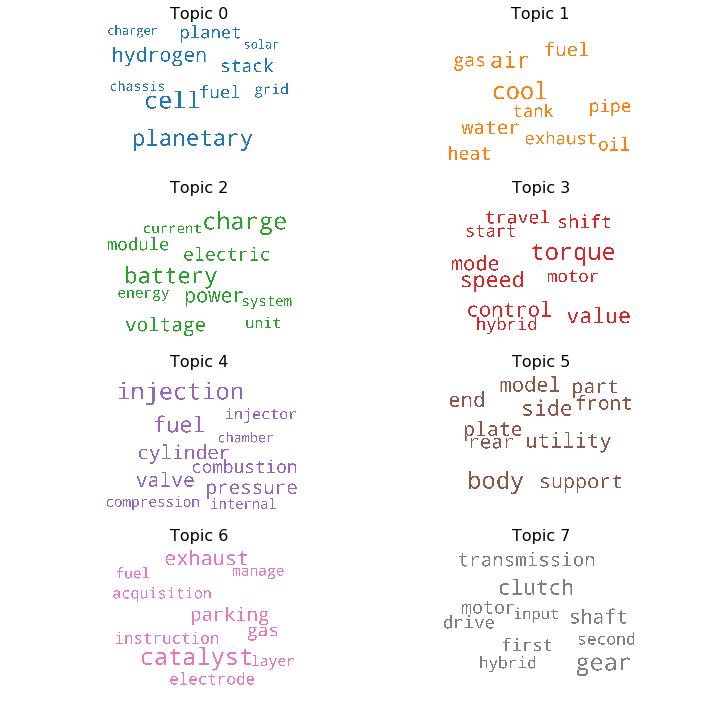

In [82]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = optimal_model.show_topics(formatted=False)

fig, axes = plt.subplots(4, 2, figsize=(10,10), sharex=True, sharey=True) # watch this value

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

### 6.1)- Bar-plot

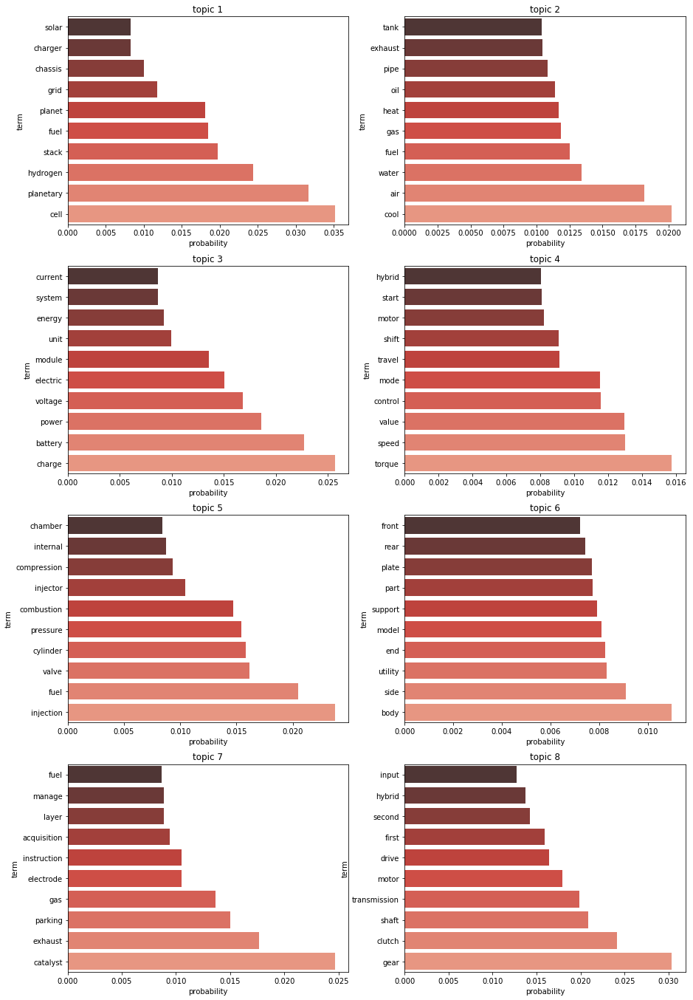

In [83]:
fiz=plt.figure(figsize=(15,30))
for i in range(8):
    df=pd.DataFrame(optimal_model.show_topic(i), columns=['term','prob']).set_index('term')
    df=df.sort_values('prob')
    
    plt.subplot(5,2,i+1)
    plt.title('topic '+str(i+1))
    sns.barplot(x='prob', y=df.index, data=df, label='patents', palette='Reds_d')
    plt.xlabel('probability')
    

plt.show()

In [84]:
import pyLDAvis
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(optimal_model, corpus_tfidf, dictionary=optimal_model.id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.178476 -0.147306       1        1  20.324478
2     -0.132559  0.012076       2        1  17.811554
5     -0.028451  0.251160       3        1  13.763348
1      0.122887  0.096611       4        1  13.009846
7     -0.202176  0.018052       5        1  12.266713
4      0.032106 -0.101780       6        1  10.119723
6      0.181084 -0.162556       7        1   7.332397
0      0.205587  0.033744       8        1   5.371935, topic_info=     Category         Freq            Term        Total  loglift  logprob
term                                                                     
402   Default  1432.000000            gear  1432.000000  30.0000  30.0000
3     Default  1479.000000            cell  1479.000000  29.0000  29.0000
379   Default  1100.000000          clutch  1100.000000  28.0000  28.0000
228   Default   867.000000       injection   867.000000  27.0000  27.0000
168   Default  2115.000000            fuel  2115.000000  26.0000  26.0000
2149  Default   589.000000       planetary   589.000000  25.0000  25.0000
4     Default  1832.000000          charge  1832.000000  24.0000  24.0000
815   Default  1513.000000          torque  1513.000000  23.0000  23.0000
392   Default  1099.000000           shaft  1099.000000  22.0000  22.0000
1393  Default   653.000000        catalyst   653.000000  21.0000  21.0000
467   Default   956.000000            cool   956.000000  20.0000  20.0000
40    Default  1014.000000    transmission  1014.000000  19.0000  19.0000
95    Default  1029.000000         exhaust  1029.000000  18.0000  18.0000
979   Default   461.000000        hydrogen   461.000000  17.0000  17.0000
773   Default  1147.000000         voltage  1147.000000  16.0000  16.0000
97    Default  1120.000000             gas  1120.000000  15.0000  15.0000
2     Default  1868.000000         battery  1868.000000  14.0000  14.0000
1295  Default   536.000000           stack   536.000000  13.0000  13.0000
284   Default   977.000000           valve   977.000000  12.0000  12.0000
45    Default  1265.000000             air  1265.000000  11.0000  11.0000
393   Default  1317.000000           speed  1317.000000  10.0000  10.0000
481   Default   742.000000           water   742.000000   9.0000   9.0000
53    Default   890.000000        cylinder   890.000000   8.0000   8.0000
954   Default  1226.000000          hybrid  1226.000000   7.0000   7.0000
273   Default  1078.000000        pressure  1078.000000   6.0000   6.0000
24    Default  2000.000000           power  2000.000000   5.0000   5.0000
386   Default   946.000000          module   946.000000   4.0000   4.0000
1350  Default   353.000000         parking   353.000000   3.0000   3.0000
2274  Default   311.000000          planet   311.000000   2.0000   2.0000
462   Default  1736.000000           motor  1736.000000   1.0000   1.0000
...       ...          ...             ...          ...      ...      ...
2978   Topic8    45.468006         standby    46.515137   2.9012  -5.9350
2606   Topic8    44.695518        sprocket    45.741695   2.9008  -5.9521
2892   Topic8    42.889050      passageway    43.938358   2.8998  -5.9934
3667   Topic8    40.959267      scheduling    42.018951   2.8984  -6.0394
2555   Topic8    93.757690         cathode    97.235977   2.8876  -5.2113
1797   Topic8   129.071152          master   135.196732   2.8776  -4.8916
2149   Topic8   544.249695       planetary   589.122681   2.8448  -3.4526
979    Topic8   419.012268        hydrogen   461.332489   2.8278  -3.7141
1352   Topic8    86.977928        recharge    92.206223   2.8656  -5.2864
2882   Topic8   103.298149       vehicular   113.649704   2.8285  -5.1144
1142   Topic8    93.947739            chip   108.735626   2.7778  -5.2093
1295   Topic8   339.159546           stack   536.387207   2.4656  -3.9255
3      Topic8   604.511536            cell  1479.606934   2.0289  -3.3476
975    Topic8

In [85]:
pyLDAvis.save_html(vis, 'pyLDAvis.html')

- The area of circle represents the importance of each topic over the entire corpus, 

- the distance between the center of circles indicate the similarity between topics. 

- For each topic, the histogram on the right side listed the top 30 most relevant terms.


- **PCoA** is a scaling or ordination method that starts with a matrix of similarities or dissimilarities between a set of individuals and aims to produce a low-dimensional graphical plot of the data in such a way that distances between points in the plot are close to original dissimilarities.

-  Salience is the state or condition of being prominent. In EV, car could be a salient term but, it does not tell any information of that technology.

- Relevance is about how much it suits to context i.e electric vehicle topic having top words related to that technology.

### 6.2) Heatmap

In [86]:
def plot_difference(mdiff, title="", annotation=None):
    """
    Helper function to plot difference between models
    """
    annotation_html = None
    if annotation is not None:
        annotation_html = [["+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
                            for (int_tokens, diff_tokens) in row]
                           for row in annotation]
        
    data = Heatmap(z=mdiff, colorscale='RdBu', text=annotation_html)
    layout = Layout(width=950, height=950, title=title,
                       xaxis=dict(title="topic"), yaxis=dict(title="topic"))
    py.iplot(dict(data=[data], layout=layout))

**For showing results in html file**

In [101]:
def plot_difference(mdiff, title="", annotation=None):
    """
    Helper function to plot difference between models
    """
    annotation_html = None
    if annotation is not None:
        annotation_html = [["+++ {}<br>--- {}".format(", ".join(int_tokens), ", ".join(diff_tokens))
                            for (int_tokens, diff_tokens) in row]
                           for row in annotation]
        
    data = Heatmap(z=mdiff, colorscale='RdBu', text=annotation_html)
    layout = Layout(width=950, height=950, title=title,
                       xaxis=dict(title="topic"), yaxis=dict(title="topic"))
    
    figure2= go.Figure(dict(data=[data], layout=layout))
    py.plot(figure2,filename='heatmap.html') # saving results as html
    #py.iplot(dict(data=[data], layout=layout))

In [102]:
difference_matrix, annotation = optimal_model.diff(optimal_model, distance='jensen_shannon', num_words=50)
plot_difference(difference_matrix, title="Topic difference [jensen shannon distance]", annotation=annotation)

### Topic network

In [88]:
# get topic distributions
topic_dist = optimal_model.state.get_lambda()

# get topic terms
num_words = 50
topic_terms = [{w for (w, _) in optimal_model.show_topic(topic, topn=num_words)} for topic in range(topic_dist.shape[0])]

In [89]:
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon
import networkx as nx
import itertools as itt

# calculate distance matrix using the input distance metric
def distance(X, dist_metric):
    return squareform(pdist(X, lambda u, v: dist_metric(u, v)))

topic_distance = distance(topic_dist, jensen_shannon)
topic_distance

array([[0.        , 0.41503748, 0.68653655, 0.68054056, 0.45285377,
        0.61929846, 0.43432209, 0.62152302],
       [0.41503748, 0.        , 0.46206829, 0.4895508 , 0.34909099,
        0.38326475, 0.48467821, 0.4409304 ],
       [0.68653655, 0.46206829, 0.        , 0.3116143 , 0.55527633,
        0.41162843, 0.74445057, 0.34203064],
       [0.68054056, 0.4895508 , 0.3116143 , 0.        , 0.45664841,
        0.47567588, 0.66738087, 0.30154383],
       [0.45285377, 0.34909099, 0.55527633, 0.45664841, 0.        ,
        0.52660722, 0.40877885, 0.48812702],
       [0.61929846, 0.38326475, 0.41162843, 0.47567588, 0.52660722,
        0.        , 0.65929663, 0.39276052],
       [0.43432209, 0.48467821, 0.74445057, 0.66738087, 0.40877885,
        0.65929663, 0.        , 0.65593731],
       [0.62152302, 0.4409304 , 0.34203064, 0.30154383, 0.48812702,
        0.39276052, 0.65593731, 0.        ]])

In [90]:
import numpy as np

# store edges b/w every topic pair along with their distance
edges = [(i, j, {'weight': topic_distance[i, j]})
         for i, j in itt.combinations(range(topic_dist.shape[0]), 2)]

# keep edges with distance below the threshold value
k = np.percentile(np.array([e[2]['weight'] for e in edges]), 20)
edges = [e for e in edges if e[2]['weight'] < k]

In [91]:
# add nodes and edges to graph layout
G = nx.Graph()
G.add_nodes_from(range(topic_dist.shape[0]))
G.add_edges_from(edges)

pos = nx.spring_layout(G)

In [92]:
index = nx.betweenness_centrality(G)

In [93]:
node_size = [index[n]*10000 for n in G]

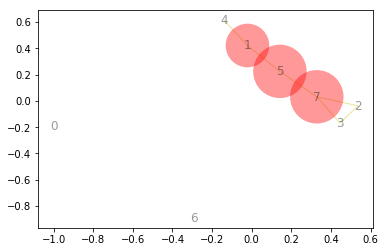

In [94]:
nx.draw_networkx(G, pos, node_size=node_size, edge_color='y', alpha=.4, linewidths=0)

### Dendogram

In [95]:
from scipy import spatial as scs
from scipy.cluster import hierarchy as sch
from scipy.spatial.distance import pdist, squareform
from gensim.matutils import jensen_shannon

# get topic distributions
topic_dist = optimal_model.state.get_lambda()

# get topic terms
num_words = 300
topic_terms = [{w for (w, _) in optimal_model.show_topic(topic, topn=num_words)} for topic in range(topic_dist.shape[0])]

# no. of terms to display in annotation
n_ann_terms = 8

# use Jensen-Shannon distance metric in dendrogram
def js_dist(X):
    return pdist(X, lambda u, v: jensen_shannon(u, v))

# define method for distance calculation in clusters
linkagefun=lambda x: sch.linkage(x, 'single')

# calculate text annotations
def text_annotation(topic_dist, topic_terms, n_ann_terms, linkagefun):
    # get dendrogram hierarchy data
    linkagefun = lambda x: sch.linkage(x, 'single')
    d = js_dist(topic_dist)
    Z = linkagefun(d)
    P = sch.dendrogram(Z, orientation="bottom", no_plot=True)

    # store topic no.(leaves) corresponding to the x-ticks in dendrogram
    x_ticks = np.arange(5, len(P['leaves']) * 10 + 5, 10)
    x_topic = dict(zip(P['leaves'], x_ticks))

    # store {topic no.:topic terms}
    topic_vals = dict()
    for key, val in x_topic.items():
        topic_vals[val] = (topic_terms[key], topic_terms[key])

    text_annotations = []
    # loop through every trace (scatter plot) in dendrogram
    for trace in P['icoord']:
        fst_topic = topic_vals[trace[0]]
        scnd_topic = topic_vals[trace[2]]
        
        # annotation for two ends of current trace
        pos_tokens_t1 = list(fst_topic[0])[:min(len(fst_topic[0]), n_ann_terms)]
        neg_tokens_t1 = list(fst_topic[1])[:min(len(fst_topic[1]), n_ann_terms)]

        pos_tokens_t4 = list(scnd_topic[0])[:min(len(scnd_topic[0]), n_ann_terms)]
        neg_tokens_t4 = list(scnd_topic[1])[:min(len(scnd_topic[1]), n_ann_terms)]

        t1 = "<br>".join((": ".join(("+++", str(pos_tokens_t1))), ": ".join(("---", str(neg_tokens_t1)))))
        t2 = t3 = ()
        t4 = "<br>".join((": ".join(("+++", str(pos_tokens_t4))), ": ".join(("---", str(neg_tokens_t4)))))

        # show topic terms in leaves
        if trace[0] in x_ticks:
            t1 = str(list(topic_vals[trace[0]][0])[:n_ann_terms])
        if trace[2] in x_ticks:
            t4 = str(list(topic_vals[trace[2]][0])[:n_ann_terms])

        text_annotations.append([t1, t2, t3, t4])

        # calculate intersecting/diff for upper level
        intersecting = fst_topic[0] & scnd_topic[0]
        different = fst_topic[0].symmetric_difference(scnd_topic[0])

        center = (trace[0] + trace[2]) / 2
        topic_vals[center] = (intersecting, different)

        # remove trace value after it is annotated
        topic_vals.pop(trace[0], None)
        topic_vals.pop(trace[2], None)  
        
    return text_annotations

# get text annotations
annotation = text_annotation(topic_dist, topic_terms, n_ann_terms, linkagefun)

# Plot dendrogram
dendro = ff.create_dendrogram(topic_dist, distfun=js_dist, labels=range(0, 8), linkagefun=linkagefun, hovertext=annotation)
dendro['layout'].update({'width': 1000, 'height': 600})
py.iplot(dendro)

### t-SNE

Refactoring results of LDA into numpy matrix (number_of_patents x number_of_topics).

In [96]:
hm = np.array([[y for (x,y) in optimal_model[corpus_tfidf[i]]] for i in range(len(corpus_tfidf))])

In [97]:
from sklearn.manifold import TSNE
tsne = TSNE(random_state=2018, perplexity=30)
embedding = tsne.fit_transform(hm)
embedding = pd.DataFrame(embedding, columns=['x','y'])
embedding['hue'] = hm.argmax(axis=1)

In [98]:
source = ColumnDataSource(
        data=dict(
            x = embedding.x,
            y = embedding.y,
            colors = [all_palettes['Set1'][8][i] for i in embedding.hue],
            title = patent.appln_title,
            year = year,
            alpha = [0.9] * embedding.shape[0],
            size = [7] * embedding.shape[0]
        )
    )
hover_tsne = HoverTool(names=["df"], tooltips="""
    <div style="margin: 10">
        <div style="margin: 0 auto; width:300px;">
            <span style="font-size: 12px; font-weight: bold;">Title:</span>
            <span style="font-size: 12px">@title</span>
            <span style="font-size: 12px; font-weight: bold;">Year:</span>
            <span style="font-size: 12px">@year</span>
        </div>
    </div>
    """)
tools_tsne = [hover_tsne, 'pan', 'wheel_zoom', 'reset']
plot_tsne = figure(plot_width=700, plot_height=700, tools=tools_tsne, title='Papers')
plot_tsne.circle('x', 'y', size='size', fill_color='colors', 
                 alpha='alpha', line_alpha=0, line_width=0.01, source=source, name="df")

callback = CustomJS(args=dict(source=source), code="""
    var data = source.data;
    var f = cb_obj.value
    x = data['x']
    y = data['y']
    colors = data['colors']
    alpha = data['alpha']
    title = data['title']
    year = data['year']
    size = data['size']
    for (i = 0; i < x.length; i++) {
        if (year[i] <= f) {
            alpha[i] = 0.9
            size[i] = 7
        } else {
            alpha[i] = 0.05
            size[i] = 4
        }
    }
    source.trigger('change');
""")

slider = Slider(start=year.min(), end=year.max(), value=2018, step=1, title="Before year")
slider.js_on_change('value', callback)

layout = column(slider, plot_tsne)

In [99]:
show(layout)